<a href="https://colab.research.google.com/github/eaedk/Machine-Learning-Tutorials/blob/main/ML_Step_By_Step_Guide.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro
## General
Machine learning allows the user to feed a computer algorithm an immense amount of data and have the computer analyze and make data-driven recommendations and decisions based on only the input data. 
In most of the situations we want to have a machine learning system to make **predictions**, so we have several categories of machine learning tasks depending on the type of prediction needed: **Classification, Regression, Clustering, Generation**, etc.

**Classification** is the task whose goal is the prediction of the label of the class to which the input belongs (e.g., Classification of images in two classes: cats and dogs).
**Regression** is the task whose goal is the prediction of numerical value(s) related to the input (e.g., House rent prediction, Estimated time of arrival ).
**Generation** is the task whose goal is the creation of something new related to the input (e.g., Text translation, Audio beat generation, Image denoising ). **Clustering** is the task of grouping a set of objects in such a way that objects in the same group (called a **cluster**) are more similar (in some sense) to each other than to those in other **clusters** (e.g., Clients clutering).

In machine learning, there are learning paradigms that relate to one aspect of the dataset: **the presence of the label to be predicted**. **Supervised Learning** is the paradigm of learning that is applied when the dataset has the label variables to be predicted, known as ` y variables`. **Unsupervised Learning** is the paradigm of learning that is applied when the dataset has not the label variables to be predicted. **Self-supervised Learning** is the paradigm of learning that is applied when part of the X dataset is considere as the label to be predicted (e.g., the Dataset is made of texts and the model try to predict the next word of each sentence).

## Notebook overview

This notebook is a guide to start practicing Machine Learning.

# Setup

## Installation
Here is the section to install all the packages/libraries that will be needed to tackle the challlenge.

In [1]:
# !pip install -q <lib_001> <lib_002> ...

## Importation
Here is the section to import all the packages/libraries that will be used through this notebook.

In [2]:
# Data handling
import pandas as pd
import numpy as np


# Vizualisation (Matplotlib, Plotly, Seaborn, etc. )
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline
from pandas.plotting import lag_plot

# EDA (pandas-profiling, etc. )
import pandas_profiling as pp

# Feature Processing (Scikit-learn processing, etc. )
import sklearn 
import scipy
import statsmodels

# Machine Learning (Scikit-learn Estimators, Catboost, LightGBM, etc. )
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_log_error

# Hyperparameters Fine-tuning (Scikit-learn hp search, cross-validation, etc. )
...

# Other packages
import os

import warnings
warnings.filterwarnings("ignore")


# Data Loading
Here is the section to load the datasets (train, eval, test) and the additional files

In [3]:
# For CSV, use pandas.read_csv
df = pd.read_csv("Telco-Customer-Churn.csv")

## Hypothesis and Questions

Hypothesis

Null hypothesis - Churning ability is influenced by price.
Alternate hypothesis - Churning ability is independent of price

Questions

1. is higher prices attributed to streaming movies
2. Is churning influenced by gender
3. Which tech support comes with higher payment prices
4. Which payment method is the most popular
5. Factors inflencing churning



# Exploratory Data Analysis: EDA
Here is the section to **inspect** the datasets in depth, **present** it, make **hypotheses** and **think** the *cleaning, processing and features creation*.

In [4]:
df.shape

(7043, 21)

In [5]:
# Code here
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
pd.set_option('display.max_rows', None)
df

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes
5,9305-CDSKC,Female,0,No,No,8,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes
6,1452-KIOVK,Male,0,No,Yes,22,Yes,Yes,Fiber optic,No,...,No,No,Yes,No,Month-to-month,Yes,Credit card (automatic),89.10,1949.4,No
7,6713-OKOMC,Female,0,No,No,10,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,No,Mailed check,29.75,301.9,No
8,7892-POOKP,Female,0,Yes,No,28,Yes,Yes,Fiber optic,No,...,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes
9,6388-TABGU,Male,0,No,Yes,62,Yes,No,DSL,Yes,...,No,No,No,No,One year,No,Bank transfer (automatic),56.15,3487.95,No


In [7]:
df_missing = df.isna().sum()
df_missing

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [8]:
df_duplicate = df.duplicated().sum()
df_duplicate

0

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [10]:
df["TotalCharges"].replace(to_replace=" ", value=np.nan, inplace=True)

In [11]:
df["TotalCharges"] = pd.to_numeric(df["TotalCharges"])

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [13]:
df.describe()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7043.000000,7032.000000
mean,0.162147,32.371149,64.761692,2283.300441
std,0.368612,24.559481,30.090047,2266.771362
min,0.000000,0.000000,18.250000,18.800000
25%,0.000000,9.000000,35.500000,401.450000
50%,0.000000,29.000000,70.350000,1397.475000
75%,0.000000,55.000000,89.850000,3794.737500
max,1.000000,72.000000,118.750000,8684.800000


In [14]:
df.corr()

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
SeniorCitizen,1.000000,0.016567,0.220173,0.102411
tenure,0.016567,1.000000,0.247900,0.825880
MonthlyCharges,0.220173,0.247900,1.000000,0.651065
TotalCharges,0.102411,0.825880,0.651065,1.000000


In [15]:
#sb.heatmap(df.corr(), annot=True)

In [16]:
df_profile = pp.ProfileReport(df)
df_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# how to handle class imbalance

## Is higher prices attributed to streaming movies? YES

In [17]:
df_movies = df[["StreamingMovies", "TotalCharges"]]
df_movies

,StreamingMovies,TotalCharges
0,No,29.85
1,No,1889.50
2,No,108.15
3,No,1840.75
4,No,151.65
5,Yes,820.50
6,No,1949.40
7,No,301.90
8,Yes,3046.05
9,No,3487.95


In [18]:
df_movies_max = df_movies.sort_values(by="TotalCharges", ascending=False)
df_movies_max.head(10)

,StreamingMovies,TotalCharges
4610,Yes,8684.80
4586,Yes,8672.45
6768,Yes,8670.10
5347,Yes,8594.40
2187,Yes,8564.75
6118,Yes,8547.15
5558,Yes,8543.25
2368,Yes,8529.50
2603,Yes,8496.70
2025,Yes,8477.70


## Is churning influenced by gender

In [19]:
Gender_churn = df.groupby(["Churn", "gender"]).count()
Gender_churn

customerID  SeniorCitizen  Partner  Dependents  tenure  \
Churn gender                                                           
No    Female        2549           2549     2549        2549    2549   
      Male          2625           2625     2625        2625    2625   
Yes   Female         939            939      939         939     939   
      Male           930            930      930         930     930   

              PhoneService  MultipleLines  InternetService  OnlineSecurity  \
Churn gender                                                                 
No    Female          2549           2549             2549            2549   
      Male            2625           2625             2625            2625   
Yes   Female           939            939              939             939   
      Male             930            930              930             930   

              OnlineBackup  DeviceProtection  TechSupport  StreamingTV  \
Churn gender                                                             
No    Female          2549              2549         2549         2549   
      Male            2625              2625         2625         2625   
Yes   Female           939               939          939          939   
      Male             930               930          930          930   

              StreamingMovies  Contract  PaperlessBilling  PaymentMethod  \
Churn gender                                                               
No    Female             2549      2549              2549           2549   
      Male               2625      2625              2625           2625   
Yes   Female              939       939               939            939   
      Male                930       930               930            930   

              MonthlyCharges  TotalCharges  
Churn gender                                
No    Female            2549          2544  
      Male              2625          2619  
Yes   Female             939           939  
      Male               930           930

## Which services comes with higher payment prices?

In [20]:
Services = df[["StreamingMovies", "PhoneService", "MultipleLines", "InternetService", "OnlineSecurity", "OnlineBackup", "DeviceProtection", "TechSupport", "StreamingTV", "Churn", "TotalCharges"]]
Services.sort_values(by="TotalCharges", ascending=False, inplace=True)

In [21]:
Services.head(20)

,StreamingMovies,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,Churn,TotalCharges
4610,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,8684.80
4586,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8672.45
6768,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8670.10
5347,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8594.40
2187,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8564.75
6118,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8547.15
5558,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8543.25
2368,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8529.50
2603,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8496.70
2025,Yes,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,No,8477.70


## Which payment method is the most popular?

In [22]:
payment_method = df.groupby(["PaymentMethod"]).sum()
payment_method

,SeniorCitizen,tenure,MonthlyCharges,TotalCharges
PaymentMethod,,,,
Bank transfer (automatic),233,67406,103745.45,4748279.90
Credit card (automatic),221,65856,101231.85,4671593.35
Electronic check,594,59538,180345.00,4944903.25
Mailed check,94,35190,70794.30,1691392.20


## Factors inflencing churning

In [23]:
SC_churn = df.groupby(["Churn", "SeniorCitizen"]).count()
SC_churn

customerID  gender  Partner  Dependents  tenure  \
Churn SeniorCitizen                                                    
No    0                    4508    4508     4508        4508    4508   
      1                     666     666      666         666     666   
Yes   0                    1393    1393     1393        1393    1393   
      1                     476     476      476         476     476   

                     PhoneService  MultipleLines  InternetService  \
Churn SeniorCitizen                                                 
No    0                      4508           4508             4508   
      1                       666            666              666   
Yes   0                      1393           1393             1393   
      1                       476            476              476   

                     OnlineSecurity  OnlineBackup  DeviceProtection  \
Churn SeniorCitizen                                                   
No    0                        4508          4508              4508   
      1                         666           666               666   
Yes   0                        1393          1393              1393   
      1                         476           476               476   

                     TechSupport  StreamingTV  StreamingMovies  Contract  \
Churn SeniorCitizen                                                        
No    0                     4508         4508             4508      4508   
      1                      666          666              666       666   
Yes   0                     1393         1393             1393      1393   
      1                      476          476              476       476   

                     PaperlessBilling  PaymentMethod  MonthlyCharges  \
Churn SeniorCitizen                                                    
No    0                          4508           4508            4508   
      1                           666            666             666   
Yes   0                          1393           1393            1393   
      1                           476            476             476   

                     TotalCharges  
Churn SeniorCitizen                
No    0                      4497  
      1                       666  
Yes   0                      1393  
      1                       476

In [24]:
Pa_churn = df.groupby(["Churn", "Partner"]).count()
Pa_churn

customerID  gender  SeniorCitizen  Dependents  tenure  \
Churn Partner                                                          
No    No             2441    2441           2441        2441    2441   
      Yes            2733    2733           2733        2733    2733   
Yes   No             1200    1200           1200        1200    1200   
      Yes             669     669            669         669     669   

               PhoneService  MultipleLines  InternetService  OnlineSecurity  \
Churn Partner                                                                 
No    No               2441           2441             2441            2441   
      Yes              2733           2733             2733            2733   
Yes   No               1200           1200             1200            1200   
      Yes               669            669              669             669   

               OnlineBackup  DeviceProtection  TechSupport  StreamingTV  \
Churn Partner                                                             
No    No               2441              2441         2441         2441   
      Yes              2733              2733         2733         2733   
Yes   No               1200              1200         1200         1200   
      Yes               669               669          669          669   

               StreamingMovies  Contract  PaperlessBilling  PaymentMethod  \
Churn Partner                                                               
No    No                  2441      2441              2441           2441   
      Yes                 2733      2733              2733           2733   
Yes   No                  1200      1200              1200           1200   
      Yes                  669       669               669            669   

               MonthlyCharges  TotalCharges  
Churn Partner                                
No    No                 2441          2439  
      Yes                2733          2724  
Yes   No                 1200          1200  
      Yes                 669           669

In [25]:
De_churn = df.groupby(["Churn", "Dependents"]).count()
De_churn

customerID  gender  SeniorCitizen  Partner  tenure  \
Churn Dependents                                                       
No    No                3390    3390           3390     3390    3390   
      Yes               1784    1784           1784     1784    1784   
Yes   No                1543    1543           1543     1543    1543   
      Yes                326     326            326      326     326   

                  PhoneService  MultipleLines  InternetService  \
Churn Dependents                                                 
No    No                  3390           3390             3390   
      Yes                 1784           1784             1784   
Yes   No                  1543           1543             1543   
      Yes                  326            326              326   

                  OnlineSecurity  OnlineBackup  DeviceProtection  TechSupport  \
Churn Dependents                                                                
No    No                    3390          3390              3390         3390   
      Yes                   1784          1784              1784         1784   
Yes   No                    1543          1543              1543         1543   
      Yes                    326           326               326          326   

                  StreamingTV  StreamingMovies  Contract  PaperlessBilling  \
Churn Dependents                                                             
No    No                 3390             3390      3390              3390   
      Yes                1784             1784      1784              1784   
Yes   No                 1543             1543      1543              1543   
      Yes                 326              326       326               326   

                  PaymentMethod  MonthlyCharges  TotalCharges  
Churn Dependents                                               
No    No                   3390            3390          3390  
      Yes                  1784            1784          1773  
Yes   No                   1543            1543          1543  
      Yes                   326             326           326

In [26]:
Contracttype = df.groupby(["Churn", "Contract"]).count()
Contracttype 

customerID  gender  SeniorCitizen  Partner  Dependents  \
Churn Contract                                                                 
No    Month-to-month        2220    2220           2220     2220        2220   
      One year              1307    1307           1307     1307        1307   
      Two year              1647    1647           1647     1647        1647   
Yes   Month-to-month        1655    1655           1655     1655        1655   
      One year               166     166            166      166         166   
      Two year                48      48             48       48          48   

                      tenure  PhoneService  MultipleLines  InternetService  \
Churn Contract                                                               
No    Month-to-month    2220          2220           2220             2220   
      One year          1307          1307           1307             1307   
      Two year          1647          1647           1647             1647   
Yes   Month-to-month    1655          1655           1655             1655   
      One year           166           166            166              166   
      Two year            48            48             48               48   

                      OnlineSecurity  OnlineBackup  DeviceProtection  \
Churn Contract                                                         
No    Month-to-month            2220          2220              2220   
      One year                  1307          1307              1307   
      Two year                  1647          1647              1647   
Yes   Month-to-month            1655          1655              1655   
      One year                   166           166               166   
      Two year                    48            48                48   

                      TechSupport  StreamingTV  StreamingMovies  \
Churn Contract                                                    
No    Month-to-month         2220         2220             2220   
      One year               1307         1307             1307   
      Two year               1647         1647             1647   
Yes   Month-to-month         1655         1655             1655   
      One year                166          166              166   
      Two year                 48           48               48   

                      PaperlessBilling  PaymentMethod  MonthlyCharges  \
Churn Contract                                                          
No    Month-to-month              2220           2220            2220   
      One year                    1307           1307            1307   
      Two year                    1647           1647            1647   
Yes   Month-to-month              1655           1655            1655   
      One year                     166            166             166   
      Two year                      48             48              48   

                      TotalCharges  
Churn Contract                      
No    Month-to-month          2220  
      One year                1306  
      Two year                1637  
Yes   Month-to-month          1655  
      One year                 166  
      Two year                  48

# Feature Processing & Engineering
Here is the section to **clean**, **process** the dataset and **create new features**.

## Drop Duplicates

In [27]:
# Use pandas.DataFrame.drop_duplicates method

print("There are no duplicates in the data") if df_duplicate == 0 else print(f"'{df_duplicate}' duplicate rows in the data")

There are no duplicates in the data


## Impute Missing Values

In [28]:
# Use sklearn.impute.SimpleImputer
#print("There are no missing values in the data") if df_missing==0 else print(df_missing)

## Check class imbalance

<Figure size 1000x800 with 0 Axes>

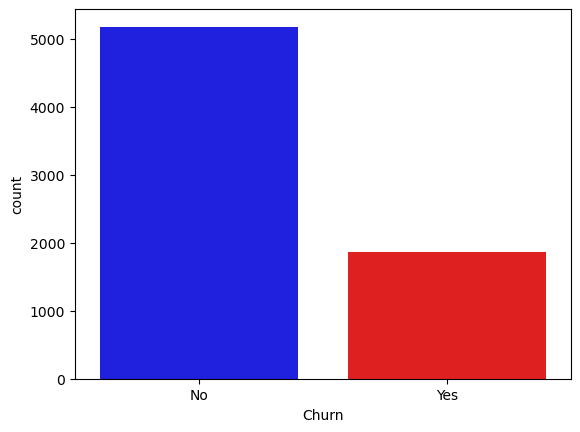

<Figure size 1000x800 with 0 Axes>

In [29]:
# class inbalance on churn column
colors = ["blue", "red",]
labels = ['No', 'Yes']
sns.set_palette(sns.color_palette(colors))
sns.countplot(df.Churn)
plt.figure(figsize=(10,8))

## New Features Creation

In [32]:
# Code here

df["PhoneService"] = df.apply(lambda x: "MultipleLines" if x["MultipleLines"] == 'Yes' and x["PhoneService"] =="Yes" 
                              else "SingleLine" if x["MultipleLines"] == "No" and x["PhoneService"] =="Yes"
                              else "None", axis=1)
                               
df["StreamingService"] = df.apply(lambda x: "Fullservice" if x["StreamingTV"] == "Yes" and x["StreamingMovies"] == "Yes"
                                 else "None" if x["StreamingTV"] == "No" and x["StreamingMovies"] == "No"
                                 else "TV" if x["StreamingTV"] == "Yes" and x["StreamingMovies"] == "No"
                                 else "Movies" if x["StreamingTV"] == "No" and x["StreamingMovies"] == "Yes" 
                                 else "NoInternet", axis=1)

df["SecurityService"] = df.apply(lambda x: "Fullsecurity" if x["OnlineSecurity"] == "Yes" and x["DeviceProtection"] == "Yes"
                                 else "None" if x["OnlineSecurity"] == "No" and x["DeviceProtection"] == "No"
                                 else "Online" if x["OnlineSecurity"] == "Yes" and x["DeviceProtection"] == "No"
                                 else "Device" if x["OnlineSecurity"] == "No" and x["DeviceProtection"] == "Yes" 
                                 else "NoInternet", axis=1)

In [33]:
df["PhoneService"]

0                None
1          SingleLine
2          SingleLine
3                None
4          SingleLine
5       MultipleLines
6       MultipleLines
7                None
8       MultipleLines
9          SingleLine
10         SingleLine
11         SingleLine
12      MultipleLines
13      MultipleLines
14         SingleLine
15      MultipleLines
16         SingleLine
17      MultipleLines
18         SingleLine
19         SingleLine
20               None
21         SingleLine
22         SingleLine
23      MultipleLines
24         SingleLine
25         SingleLine
26      MultipleLines
27               None
28      MultipleLines
29         SingleLine
30      MultipleLines
31         SingleLine
32         SingleLine
33         SingleLine
34         SingleLine
35      MultipleLines
36         SingleLine
37         SingleLine
38      MultipleLines
39      MultipleLines
40         SingleLine
41      MultipleLines
42         SingleLine
43      MultipleLines
44      MultipleLines
45      Mu

In [46]:
# rank new features for encoding

level_phoneservice = ["None", "SingleLine", "MultipleLines"]
level_streamingservice = ["NoInternet", "None", "Movies", "TV", "Fullservice"]
level_securityservice = ["NoInternet", "None", "Device", "Online", "Fullsecurity"]

## Features Encoding




In [47]:

# Convert columns to binary integers

df["gender"].replace({"M":0, "F":1}, inplace=True)
df["Churn"].replace({"No":0, "Yes":1}, inplace=True)
df["Partner"].replace({"No":0, "Yes":1}, inplace=True)
df["Dependents"].replace({"No":0, "Yes":1}, inplace=True)
df["InternetService"].replace({"No":0, "DSL":1, "Fiber optic":2}, inplace=True)
df["TechSupport"].replace({"No internet service":0, "No":1, "Yes":2}, inplace=True)
df["OnlineBackup"].replace({"No internet service":0, "No":1, "Yes":2}, inplace=True)


In [48]:
# label/ordinal encoding

from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
df["gender"] = label_encoder.fit_transform(df["gender"])
df["Churn"] = label_encoder.fit_transform(df["Churn"])
df["Partner"] = label_encoder.fit_transform(df["Partner"])
df["Dependents"] = label_encoder.fit_transform(df["Dependents"])
df["InternetService"] = label_encoder.fit_transform(df["InternetService"])
df["TechSupport"] = label_encoder.fit_transform(df["TechSupport"])
df["OnlineBackup"] = label_encoder.fit_transform(df["OnlineBackup"])

In [50]:
from sklearn.preprocessing import OrdinalEncoder

# encode phone service
ordinal_encoder_phone = OrdinalEncoder(categories=[level_phoneservice])
ordinal_encoder_phone.fit(df[["PhoneService"]])
df["PhoneService"] = ordinal_encoder_phone.transform(df[["PhoneService"]])

# encode streaming service
ordinal_encoder_streaming = OrdinalEncoder(categories=[level_streamingservice])
ordinal_encoder_streaming.fit(df[["StreamingService"]])
df["StreamingService"] = ordinal_encoder_streaming.transform(df[["StreamingService"]])

# encode security service
ordinal_encoder_security = OrdinalEncoder(categories=[level_securityservice])
ordinal_encoder_security.fit(df[["SecurityService"]])
df["SecurityService"] = ordinal_encoder_security.transform(df[["SecurityService"]])

In [51]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,StreamingService,SecurityService
0,7590-VHVEG,0,0,1,0,1,0.0,No phone service,1,No,...,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,0,1.0,1.0
1,5575-GNVDE,1,0,0,0,34,1.0,No,1,Yes,...,No,No,One year,No,Mailed check,56.95,1889.50,0,1.0,4.0
2,3668-QPYBK,1,0,0,0,2,1.0,No,1,Yes,...,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,1.0,3.0
3,7795-CFOCW,1,0,0,0,45,0.0,No phone service,1,Yes,...,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,0,1.0,4.0
4,9237-HQITU,0,0,0,0,2,1.0,No,2,No,...,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,1.0,1.0


In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   int64  
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   int64  
 4   Dependents        7043 non-null   int64  
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   float64
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   int64  
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   int64  
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [57]:
# From sklearn.preprocessing use OneHotEncoder to encode the categorical features.

from sklearn.preprocessing import OneHotEncoder

cat_col = df[["Contract", "PaymentMethod"]]

encoder = OneHotEncoder (sparse=False)
encoded_features = encoder.fit_transform(cat_col)

encoded_cat_col = pd.DataFrame(encoded_features, columns=encoder.get_feature_names())


In [58]:
encoded_cat_col.head(df, encoded_cat_col, axis=1)

,x0_Month-to-month,x0_One year,x0_Two year,x1_Bank transfer (automatic),x1_Credit card (automatic),x1_Electronic check,x1_Mailed check
0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [59]:
# merge all data  
encoded_df = pd.concat([df, encoded_cat_col], axis=1)
encoded_df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,Churn,StreamingService,SecurityService,x0_Month-to-month,x0_One year,x0_Two year,x1_Bank transfer (automatic),x1_Credit card (automatic),x1_Electronic check,x1_Mailed check
0,7590-VHVEG,0,0,1,0,1,0.0,No phone service,1,No,...,0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,5575-GNVDE,1,0,0,0,34,1.0,No,1,Yes,...,0,1.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,3668-QPYBK,1,0,0,0,2,1.0,No,1,Yes,...,1,1.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,7795-CFOCW,1,0,0,0,45,0.0,No phone service,1,Yes,...,0,1.0,4.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,9237-HQITU,0,0,0,0,2,1.0,No,2,No,...,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [66]:
# modify data by dropping columns used for encoding and other columns not necessary for modeling
model_df = encoded_df.drop(["customerID", "MultipleLines", "OnlineSecurity", "DeviceProtection", "StreamingTV", "StreamingMovies", "PaperlessBilling", "Contract", "PaymentMethod"], axis=1)
model_df.head() 

,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,InternetService,OnlineBackup,TechSupport,MonthlyCharges,...,Churn,StreamingService,SecurityService,x0_Month-to-month,x0_One year,x0_Two year,x1_Bank transfer (automatic),x1_Credit card (automatic),x1_Electronic check,x1_Mailed check
0,0,0,1,0,1,0.0,1,Yes,0,29.85,...,0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,0,0,0,34,1.0,1,No,0,56.95,...,0,1.0,4.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,1,0,0,0,2,1.0,1,Yes,0,53.85,...,1,1.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1,0,0,0,45,0.0,1,No,1,42.30,...,0,1.0,4.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
4,0,0,0,0,2,1.0,2,No,0,70.70,...,1,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


## Dataset Splitting

In [ ]:
# Use train_test_split with a random_state, and add stratify for Classification

## Features Scaling


In [ ]:
# From sklearn.preprocessing use StandardScaler, MinMaxScaler, etc.

## Optional: Train Dataset Balancing 

In [ ]:
# Use Over-sampling/Under-sampling methods, more details here: https://imbalanced-learn.org/stable/install.html

# Machine Learning Modeling 
Here is the section to **build**, **train**, **evaluate** and **compare** the models to each others.

## Simple Model #001

Please, keep the following structure to try all the model you want.

### Create the Model

In [ ]:
# Code here

### Train the Model

In [ ]:
# Use the .fit method

### Evaluate the Model on the Evaluation dataset (Evalset)

In [ ]:
# Compute the valid metrics for the use case # Optional: show the classification report 

### Predict on a unknown dataset (Testset)

In [ ]:
# Use .predict method # .predict_proba is available just for classification

## Simple Model #002

### Create the Model

In [ ]:
# Code here

### Train the Model

In [ ]:
# Use the .fit method

### Evaluate the Model on the Evaluation dataset (Evalset)

In [ ]:
# Compute the valid metrics for the use case # Optional: show the classification report 

### Predict on a unknown dataset (Testset)

In [ ]:
# Use .predict method # .predict_proba is available just for classification

## Models comparison
Create a pandas dataframe that will allow you to compare your models.

Find a sample frame below :

|     | Model_Name     | Metric (metric_name)    | Details  |
|:---:|:--------------:|:--------------:|:-----------------:|
| 0   |  -             |  -             | -                 |
| 1   |  -             |  -             | -                 |


You might use the pandas dataframe method `.sort_values()` to sort the dataframe regarding the metric.

## Hyperparameters tuning 

Fine-tune the Top-k models (3 < k < 5) using a ` GridSearchCV`  (that is in sklearn.model_selection
) to find the best hyperparameters and achieve the maximum performance of each of the Top-k models, then compare them again to select the best one.

In [ ]:
# Code here

# Export key components
Here is the section to **export** the important ML objects that will be use to develop an app: *Encoder, Scaler, ColumnTransformer, Model, Pipeline, etc*.

In [ ]:
# Use pickle : put all your key components in a python dictionary and save it as a file that will be loaded in an app